# Working with Images
Most of the times, when people think of working with images, photoshop is what comes to mind. In this notebook we will learn how to using Python for image manipulation using PIL library.

The Python Imaging Library adds image processing capabilities to your Python interpreter.

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import image
import seaborn as sns

# Loading Images with Matplotlib

<class 'numpy.ndarray'> (1400, 1400, 3)


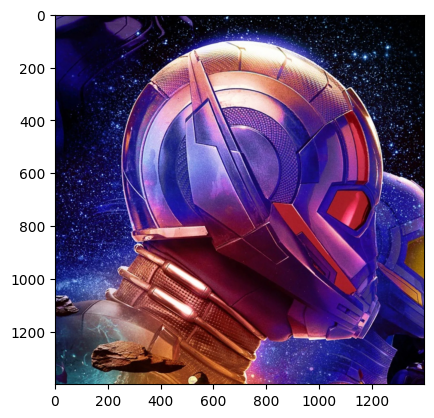

In [7]:
img=image.imread('/content/sample_data/ML_image/quantumania_1.jpg')
print(type(img),img.shape)
plt.imshow(img)

<class 'numpy.ndarray'> (960, 1920, 3)


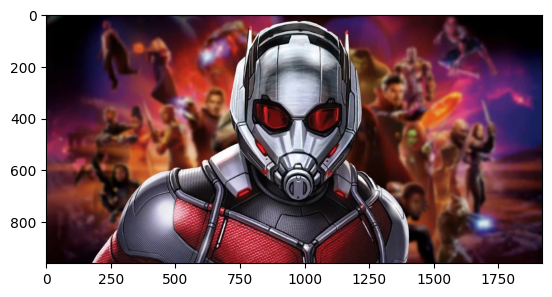

In [8]:
img=image.imread("/content/sample_data/ML_image/quantumania_2.png")
print(type(img),img.shape)
plt.imshow(img)

<class 'numpy.ndarray'> (452, 640, 3)


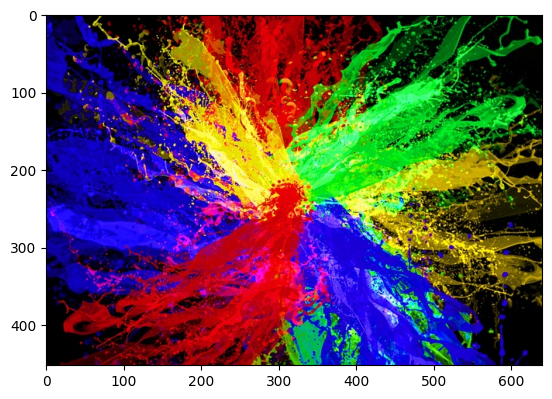

In [9]:
img=image.imread('/content/sample_data/ML_image/test_image.jpg')
print(type(img),img.shape)
plt.imshow(img)

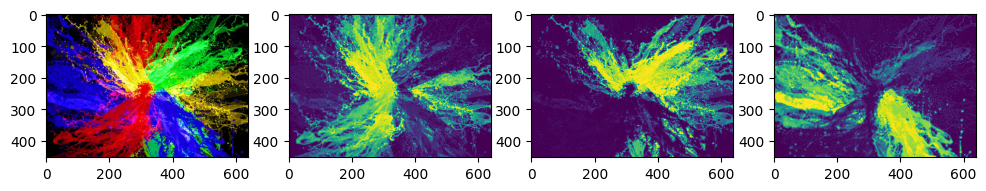

In [10]:
plt.figure(figsize=(12,12))

plt.subplot(1,4,1)
plt.imshow(img)

plt.subplot(1,4,2)
plt.imshow(img[:,:,0])

plt.subplot(1,4,3)
plt.imshow(img[:,:,1])

plt.subplot(1,4,4)
plt.imshow(img[:,:,2])



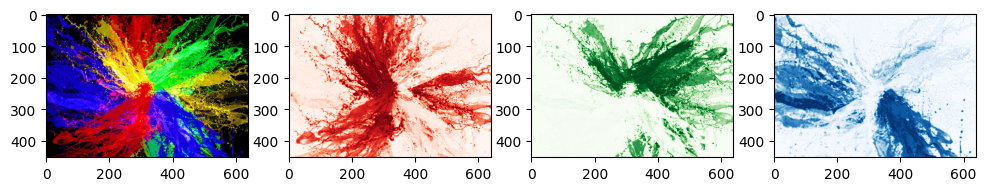

In [11]:
plt.figure(figsize=(12,12))

plt.subplot(1,4,1)
plt.imshow(img)

plt.subplot(1,4,2)
plt.imshow(img[:,:,0],cmap='Reds')

plt.subplot(1,4,3)
plt.imshow(img[:,:,1],cmap='Greens')

plt.subplot(1,4,4)
plt.imshow(img[:,:,2],cmap="Blues")

# Loading Images with PIL

In [12]:
from PIL import Image

In [13]:
img=Image.open('/content/sample_data/ML_image/bp.jpg')
print(type(img))
img.show()  # Opens in new window

<class 'PIL.JpegImagePlugin.JpegImageFile'>


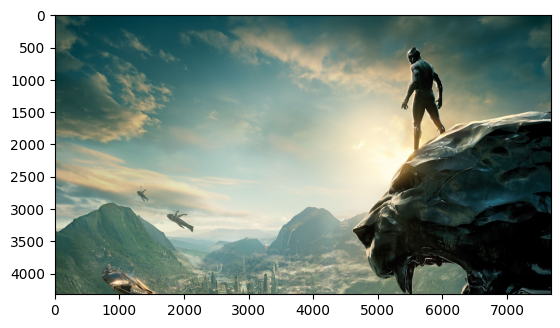

In [14]:
plt.imshow(img)

In [15]:
print(img.size) # (width, Height in pixels)

print(img.filename)

print(img.format)

print(img.mode)

(7680, 4320)
/content/sample_data/ML_image/bp.jpg
JPEG
RGB


# Image Format
  1.Image formats refer to the ways in which digital images are encoded and
  stored. Each format has its own specifications for representing color information, compression, and other features. Common image formats include:

  2.JPEG (Joint Photographic Experts Group): Well-suited for photographs and images with complex color gradients. It uses lossy compression.

  3.PNG (Portable Network Graphics): Suitable for images with transparency and sharp edges, such as logos and icons. It uses lossless compression.

  4.GIF (Graphics Interchange Format): Often used for simple graphics, animations, and images with a limited color palette. It uses lossless compression and supports animation.

  5.TIFF (Tagged Image File Format): A flexible format suitable for high-quality images and professional printing. It supports lossless compression and can store multiple images in a single file.

  6.BMP (Bitmap): A basic, uncompressed format used for simple graphics. It stores color information pixel by pixel.

  7.RAW: A format used to store minimally processed data from the image sensor of a digital camera. It retains more information but results in larger file sizes.

  8.WebP: Developed by Google, it provides both lossy and lossless compression. It aims for smaller file sizes while maintaining image quality.

# Image Mode
  1.An image mode determines the number of colors that can be displayed in an image and can also affect the file size of the image. Image modes represent the color space or the number of channels in an image. The most common image modes include:

  2.RGB (Red, Green, Blue): The most common color mode for digital images. Each pixel is composed of three color channels: red, green, and blue.

  3.Grayscale: A single-channel mode where pixel values represent intensity levels from black to white. It is often used for black-and-white images.

  4.CMYK (Cyan, Magenta, Yellow, Black): Used in color printing. It represents colors using four channels: cyan, magenta, yellow, and black.

  5.Indexed Color: Uses a color palette to represent the image. Each pixel's color is an index into the palette.

  6.RGBA (Red, Green, Blue, Alpha): Similar to RGB but includes an additional channel (alpha) for representing transparency.

  7.HSV (Hue, Saturation, Value): HSV is often used in computer vision and image processing tasks because it separates color information from brightness, making certain operations more intuitive.

# Images as arrays of data
What is an image? So far, PIL has handled loading images and displaying them. However, if we're going to use images as data, we need to understand what that data looks like.
Most image formats have three color "channels": red, green, and blue (some images also have a fourth channel called "alpha" that controls transparency). For each pixel in an image, there is a value for every channel.

The way this is represented as data is as a three-dimensional matrix. The width of the matrix is the width of the image, the height of the matrix is the height of the image, and the depth of the matrix is the number of channels. So, as we saw, the height and width of our image are both 100 pixels. This means that the underlying data is a matrix with the dimensions 100x100x3.

<class 'PIL.JpegImagePlugin.JpegImageFile'>


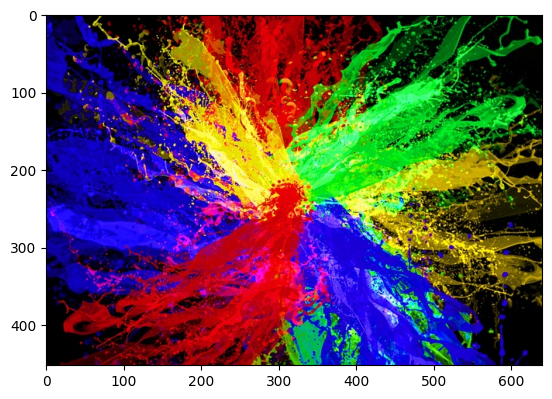

In [16]:
img=Image.open('/content/sample_data/ML_image/test_image.jpg')
print(type(img))
img.show()
plt.imshow(img)

In [17]:
# Turn our image object into a NumPy array
img_arr=np.array(img)
print(type(img_arr),img_arr.shape)

<class 'numpy.ndarray'> (452, 640, 3)


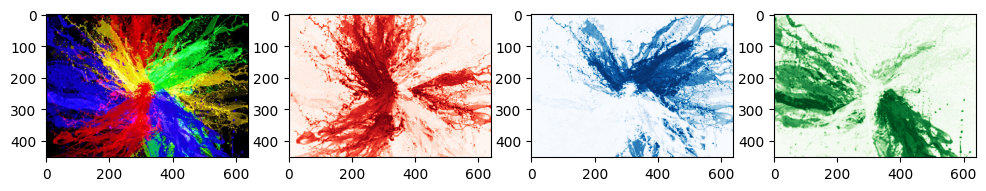

In [18]:
plt.figure(figsize=(12,12))

plt.subplot(1,4,1)
plt.imshow(img_arr)

plt.subplot(1,4,2)
plt.imshow(img_arr[:,:,0],cmap="Reds")

plt.subplot(1,4,3)
plt.imshow(img_arr[:,:,1],cmap="Blues")

plt.subplot(1,4,4)
plt.imshow(img_arr[:,:,2],cmap="Greens")

In [19]:
img.split()

(<PIL.Image.Image image mode=L size=640x452>,
 <PIL.Image.Image image mode=L size=640x452>,
 <PIL.Image.Image image mode=L size=640x452>)

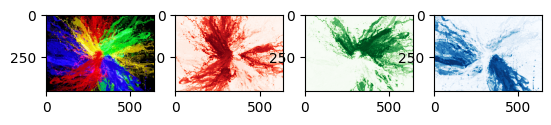

In [20]:
red,green,blue=img.split()

plt.subplot(1,4,1)
plt.imshow(img)

plt.subplot(1,4,2)
plt.imshow(red,cmap="Reds")

plt.subplot(1,4,3)
plt.imshow(green,cmap="Greens")

plt.subplot(1,4,4)
plt.imshow(blue,cmap="Blues")

# Image manipulation with PIL
Pillow has a number of common image manipulation tasks built into the library. For example, one may want to resize an image so that the file size is smaller. Or, perhaps, convert an image to black-and-white instead of color. Operations that Pillow provides include:

    . rotating
    . flipping
    . cropping
    . resizing

Often, these kinds of manipulations are part of the pipeline for turning a small number of images into more images to create training data for machine learning algorithms. This technique is called data augmentation, and it is a common technique for image classification.
We'll try a couple of these operations and look at the results.
# Rotating

In [21]:
from PIL import Image
img=Image.open('/content/sample_data/ML_image/bp.jpg')

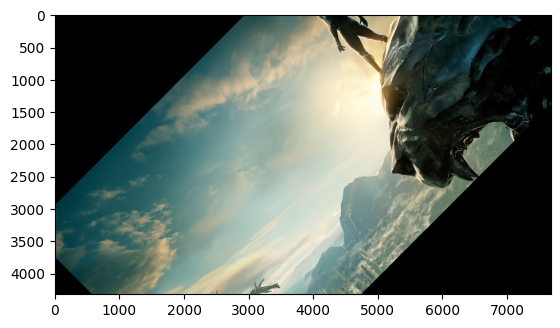

In [22]:
# rotate the image by 45 degrees
image_rotated=img.rotate(45)
plt.imshow(image_rotated)

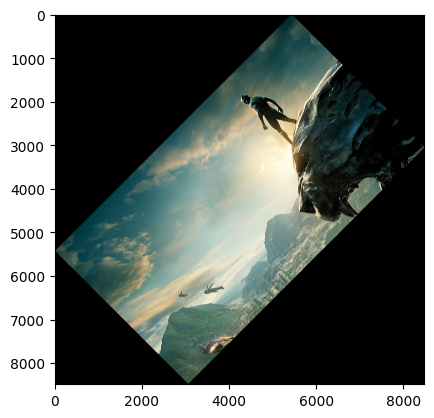

In [23]:
# rotate the image by 45 degrees and expand=True
image_rotated=img.rotate(45,expand=True)
plt.imshow(image_rotated)

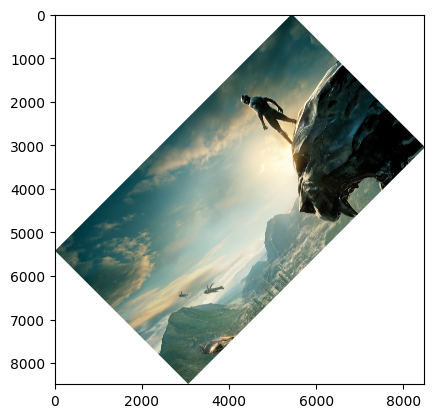

In [24]:
# rotate the image by 45 degrees with fillcolor
image_rotated=img.rotate(45,expand=True,fillcolor=(255,255,255))
plt.imshow(image_rotated)

# Cropping
In the crop() method:

left and upper are the x and y coordinates of the upper-left corner of the region to crop, respectively.
right and lower are the x and y coordinates of the lower-right corner of the region to crop, respectively.

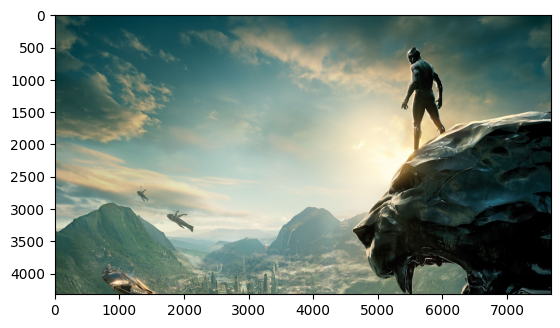

In [25]:
plt.imshow(img)

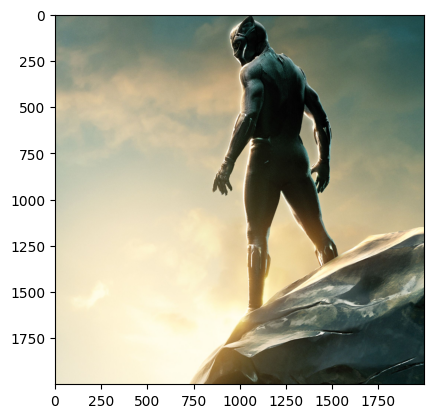

In [26]:
# Crop the image to 25, 25, 75, 75 - Left_x, top_y, right_x, bottom_y
img_cropped= img.crop((4500,500,6500,2500))
plt.imshow(img_cropped)

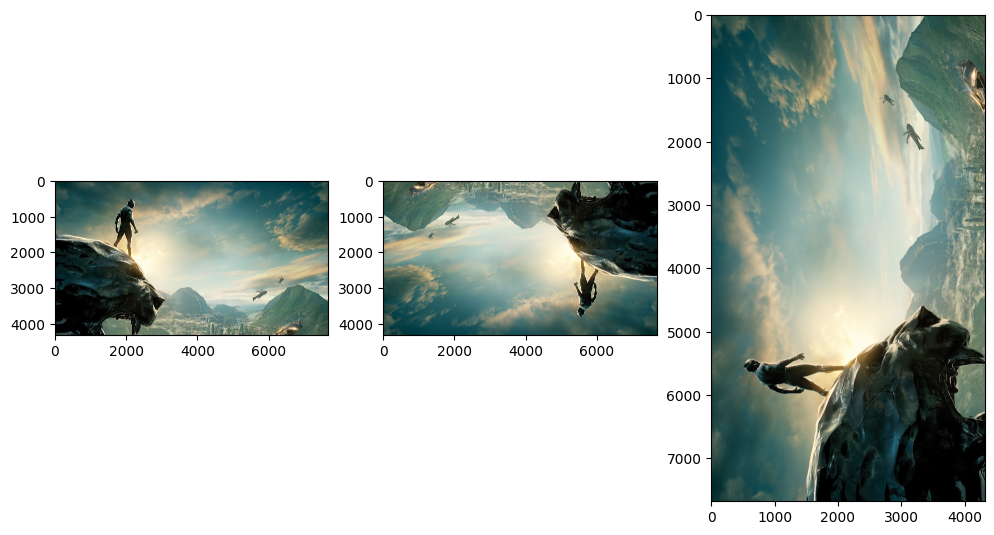

In [27]:
plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
# flip the image left to right
img_flip_horizental= img.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
plt.imshow(img_flip_horizental)

plt.subplot(1,3,2)
# flip the image left to right
img_flip_vertical= img.transpose(Image.Transpose.FLIP_TOP_BOTTOM)
plt.imshow(img_flip_vertical)

plt.subplot(1,3,3)
# flip the image left to right
flip_imaged=img.transpose(Image.Transpose.TRANSPOSE)
plt.imshow(flip_imaged)


# Resizing

In [28]:
new_img=img.resize((200,200))
new_img.save('/content/sample_data/ML_image/bp_200.jpg')
print(img.size)
print(new_img.size)

(7680, 4320)
(200, 200)


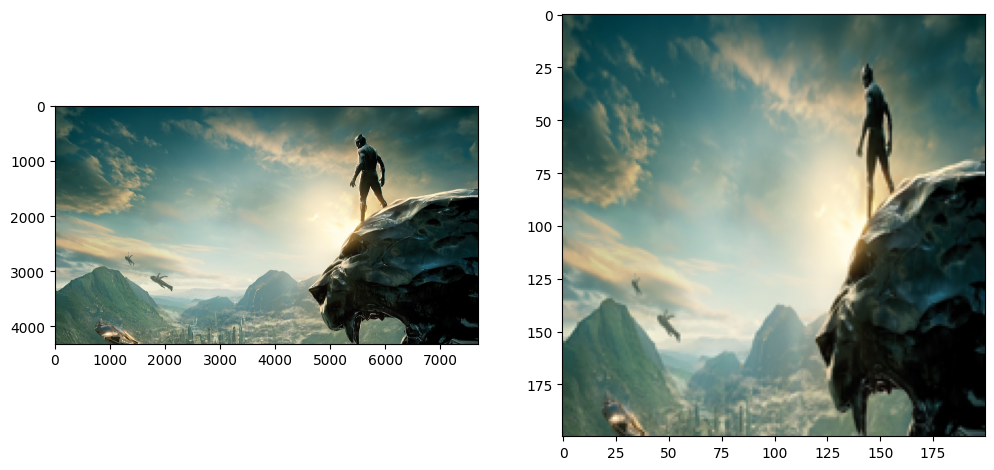

In [29]:
plt.figure(figsize=(12,12))

plt.subplot(1,2,1)
plt.imshow(img)

plt.subplot(1,2,2)
plt.imshow(new_img)


(200, 113)


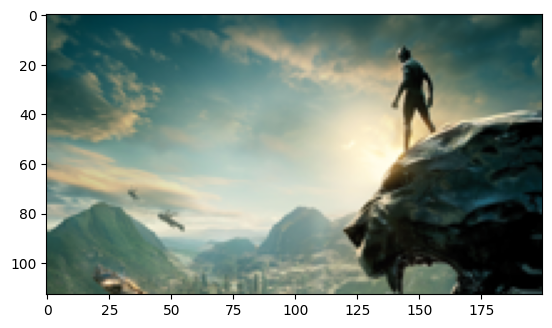

In [30]:
# thumbnail take cares of the aspect ratio
img.thumbnail((200,200))
img.save('/content/sample_data/ML_image/bp_thumbnail.jpg')
print(img.size)
plt.imshow(img)

# Image Enhancement
PIL can change the vibrance, contrast, brightness and sharpness using ImageEnhance.

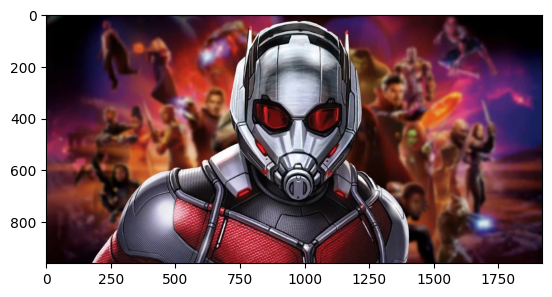

In [31]:
img=Image.open("/content/sample_data/ML_image/quantumania_2.png")
plt.imshow(img)

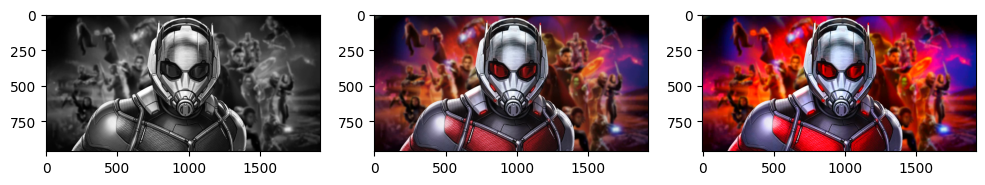

In [32]:
from PIL import ImageEnhance

plt.figure(figsize=(12,8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc

color_enhancer=ImageEnhance.Color(img)

plt.subplot(1,3,1)
plt.imshow(color_enhancer.enhance(0))

plt.subplot(1,3,2)
plt.imshow(color_enhancer.enhance(1))

plt.subplot(1,3,3)
plt.imshow(color_enhancer.enhance(2))

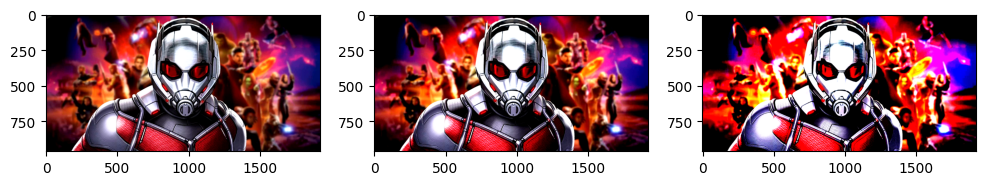

In [33]:
from PIL import ImageEnhance

plt.figure(figsize=(12,8))

contrast_enhancer =ImageEnhance.Contrast(img)

plt.subplot(1,3,1)
plt.imshow(contrast_enhancer.enhance(1.5))

plt.subplot(1,3,2)
plt.imshow(contrast_enhancer.enhance(2))

plt.subplot(1,3,3)
plt.imshow(contrast_enhancer.enhance(5))


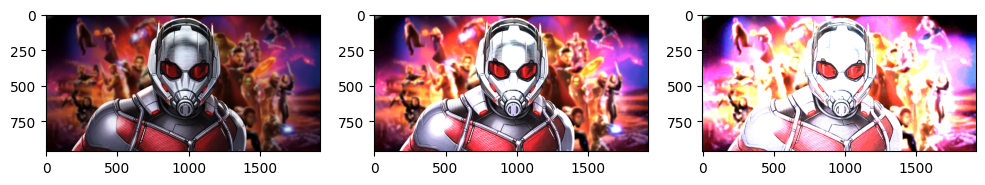

In [34]:
from PIL import ImageEnhance

plt.figure(figsize=(12,8))

brightness_enhencer = ImageEnhance.Brightness(img)

plt.subplot(1,3,1)
plt.imshow(brightness_enhencer.enhance(1))

plt.subplot(1,3,2)
plt.imshow(brightness_enhencer.enhance(2))

plt.subplot(1,3,3)
plt.imshow(brightness_enhencer.enhance(5))



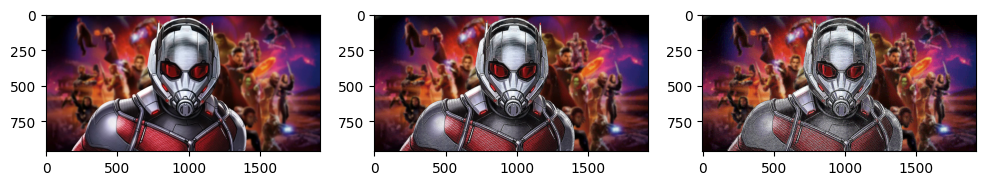

In [35]:
from PIL import ImageEnhance

plt.figure(figsize=(12,8))

sharpness_enhencer = ImageEnhance.Sharpness(img)

plt.subplot(1,3,1)
plt.imshow(sharpness_enhencer.enhance(2))

plt.subplot(1,3,2)
plt.imshow(sharpness_enhencer.enhance(20))

plt.subplot(1,3,3)
plt.imshow(sharpness_enhencer.enhance(50))


# Filters
PIL can also do blur, contour, emboss, sharpening, smooth, etc using ImageFilter.

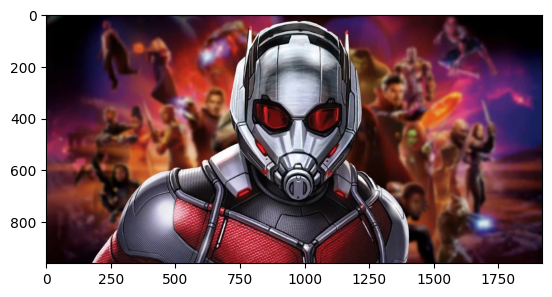

In [36]:
img = Image.open('/content/sample_data/ML_image/quantumania_2.png')
plt.imshow(img)

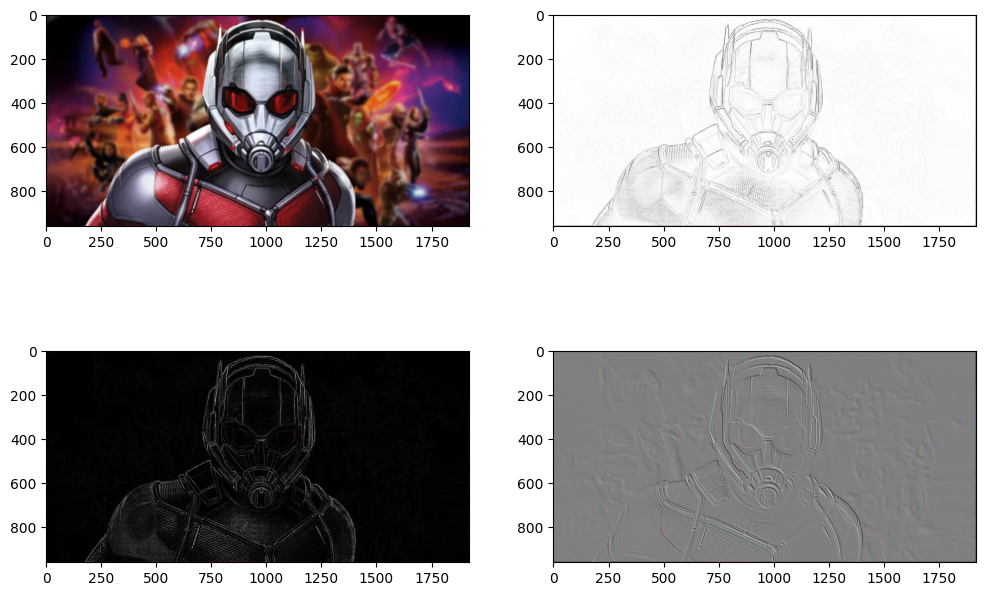

In [37]:
from PIL import ImageFilter

plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.imshow(img.filter(ImageFilter.BLUR))

plt.subplot(2,2,2)
plt.imshow(img.filter(ImageFilter.CONTOUR))

plt.subplot(2,2,3)
plt.imshow(img.filter(ImageFilter.FIND_EDGES))

plt.subplot(2,2,4)
plt.imshow(img.filter(ImageFilter.EMBOSS))

# Putting Text on the Image
# Steps 1: Creating the PIL image object


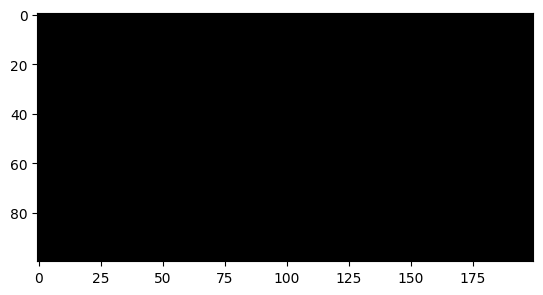

In [38]:
from PIL import Image
img =Image.new(mode="RGB",size=(200,100),color=(0,0,0))
plt.imshow(img)

# Step 2: Create a Draw Object

In [39]:
from PIL import ImageDraw
draw=ImageDraw.Draw(img)

# Step 3: Preparing the Text Element and Adding Text to the Image

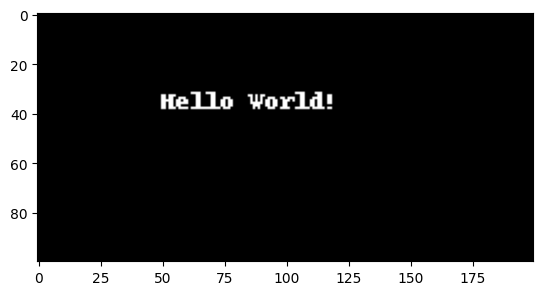

In [40]:
text='Hello World!'
draw.text((50,30),text)
plt.imshow(img)

# Text Color
Checkout below mentioned resources for font type and color

  Font - https://fonts.google.com/
  Color - https://g.co/kgs/hMV71G

In [41]:
# Exploring Built-in Color Names in PIL

from PIL import ImageColor

colors=ImageColor.colormap

print(colors)

# Hexcode representation of  colors

{'aliceblue': '#f0f8ff', 'antiquewhite': '#faebd7', 'aqua': '#00ffff', 'aquamarine': '#7fffd4', 'azure': '#f0ffff', 'beige': '#f5f5dc', 'bisque': '#ffe4c4', 'black': '#000000', 'blanchedalmond': '#ffebcd', 'blue': '#0000ff', 'blueviolet': '#8a2be2', 'brown': '#a52a2a', 'burlywood': '#deb887', 'cadetblue': '#5f9ea0', 'chartreuse': '#7fff00', 'chocolate': '#d2691e', 'coral': '#ff7f50', 'cornflowerblue': '#6495ed', 'cornsilk': '#fff8dc', 'crimson': '#dc143c', 'cyan': '#00ffff', 'darkblue': '#00008b', 'darkcyan': '#008b8b', 'darkgoldenrod': '#b8860b', 'darkgray': '#a9a9a9', 'darkgrey': '#a9a9a9', 'darkgreen': '#006400', 'darkkhaki': '#bdb76b', 'darkmagenta': '#8b008b', 'darkolivegreen': '#556b2f', 'darkorange': '#ff8c00', 'darkorchid': '#9932cc', 'darkred': '#8b0000', 'darksalmon': '#e9967a', 'darkseagreen': '#8fbc8f', 'darkslateblue': '#483d8b', 'darkslategray': '#2f4f4f', 'darkslategrey': '#2f4f4f', 'darkturquoise': '#00ced1', 'darkviolet': '#9400d3', 'deeppink': '#ff1493', 'deepskyblue'

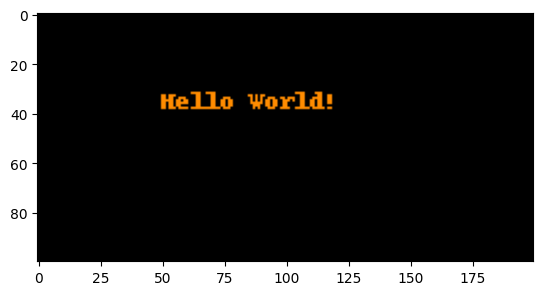

In [42]:
# Adding Colored Text to the Image
draw.text((50,30),text,fill=(255,140,0))
plt.imshow(img)

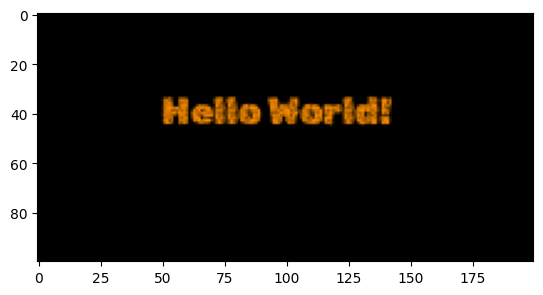

In [43]:
from PIL import Image , ImageDraw,ImageFont
img=Image.new(mode="RGB",size=(200,100),color=(0,0,0))
draw=ImageDraw.Draw(img)
text="Hello World!"
font=ImageFont.truetype('/content/sample_data/ML_image/RubikDistressed-Regular.ttf',15)
draw.text((50,30),text,font=font,fill=(250,140,0))
plt.imshow(img)

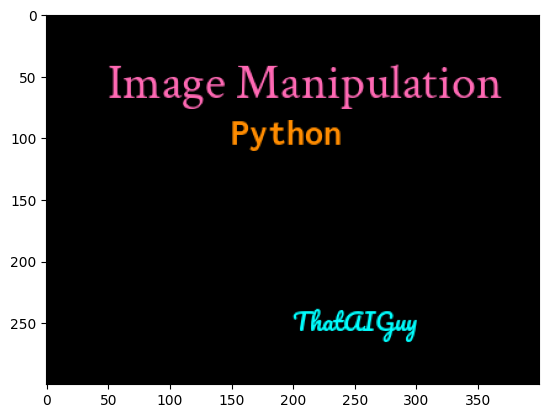

In [48]:
from PIL import Image,ImageFont,ImageDraw
img=Image.new(mode="RGB",size=(400,300),color=(0,0,0))
draw=ImageDraw.Draw(img)
text_1 = 'Image Manipulation'
text_2 = 'Python'
text_3 = 'ThatAIGuy'

font_1=ImageFont.truetype("/content/sample_data/ML_image/CrimsonText-Regular (1).ttf",40)
font_2=ImageFont.truetype("/content/sample_data/ML_image/Inconsolata-Bold.ttf",30)
font_3=ImageFont.truetype("/content/sample_data/ML_image/Pacifico-Regular.ttf",20)

draw.text((50,30),text_1,font=font_1,fill='hotpink')
draw.text((150,80),text_2,font=font_2,fill=(255,140,0))
draw.text((200,230),text_3,font=font_3,fill='aqua')
plt.imshow(img)

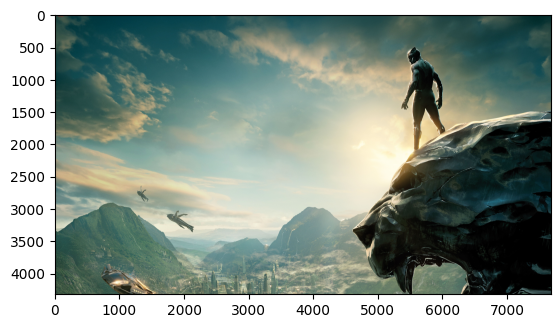

In [49]:
from PIL import ImageFont,ImageDraw,Image
img=Image.open("/content/sample_data/ML_image/bp.jpg")

draw=ImageDraw.Draw(img)

draw.text((50,30),text="Black Penther",fill=(255,0,0))

plt.imshow(img)

img.save("/content/sample_data/ML_image/bp_text_1.jpg")

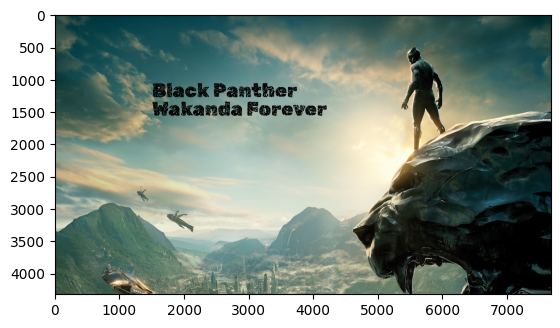

In [55]:
from PIL import Image,ImageFont,ImageDraw

# Open the image
img=Image.open("/content/sample_data/ML_image/bp.jpg")

# Call Draw method to add 2D graphics on the image
draw=ImageDraw.Draw(img)

# Customize font type and font style
cust_font=ImageFont.truetype('/content/sample_data/ML_image/RubikDistressed-Regular.ttf',300)

TEXT= """Black Panther
Wakanda Forever"""

# Add text to image
draw.text((1500,1000),text=TEXT,font=cust_font,fill=(0,0,0))

plt.imshow(img)

# Save the image
img.save('/content/sample_data/ML_image/bp_text_2.jpg')


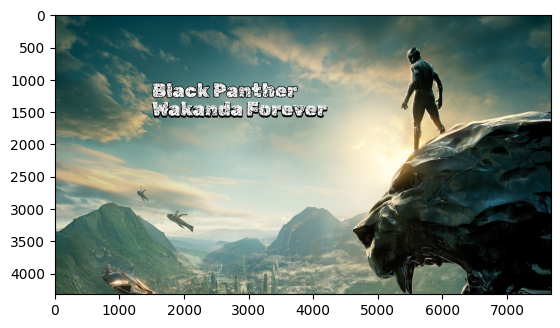

In [59]:
from PIL import Image,ImageFont,ImageDraw

img=Image.open('/content/sample_data/ML_image/bp.jpg')

draw=ImageDraw.Draw(img)

cust_font=ImageFont.truetype('/content/sample_data/ML_image/RubikDistressed-Regular.ttf',300)

TEXT="""Black Panther
Wakanda Forever"""

draw.text((1500,1000),text=TEXT,font=cust_font,fill=(0,0,0),stroke_width=10)
draw.text((1500,1000),text=TEXT,font=cust_font,fill=(255,255,255))
plt.imshow(img)

img.save("/content/sample_data/ML_image/bp_text_3.jpg")

# Flatten multichannel image

In [61]:
img=Image.open('/content/sample_data/ML_image/bp.jpg')
img_arr= np.array(img)
print(type(img_arr),img_arr.shape)


<class 'numpy.ndarray'> (4320, 7680, 3)


In [62]:
img_arr

array([[[31, 66, 62],
        [32, 67, 63],
        [33, 68, 64],
        ...,
        [ 5, 47, 46],
        [ 3, 45, 44],
        [ 1, 43, 42]],

       [[35, 70, 66],
        [35, 70, 66],
        [36, 71, 67],
        ...,
        [ 5, 47, 46],
        [ 4, 46, 45],
        [ 3, 45, 44]],

       [[38, 73, 69],
        [38, 73, 69],
        [38, 73, 69],
        ...,
        [ 4, 46, 45],
        [ 4, 46, 45],
        [ 3, 45, 44]],

       ...,

       [[54, 77, 61],
        [53, 76, 60],
        [54, 77, 61],
        ...,
        [52, 72, 73],
        [53, 73, 74],
        [51, 71, 72]],

       [[54, 77, 61],
        [53, 76, 60],
        [54, 77, 61],
        ...,
        [51, 71, 72],
        [53, 73, 74],
        [52, 72, 73]],

       [[54, 77, 61],
        [53, 76, 60],
        [54, 77, 61],
        ...,
        [51, 71, 72],
        [53, 73, 74],
        [52, 72, 73]]], dtype=uint8)

In Python, the term **"ravel"** refers to the process of flattening an array into a one-dimensional array. This means that all elements of the array are put into a single row, preserving the order of the elements.

NumPy, a popular numerical computing library in Python, provides the **ravel()** function to perform this operation. Here's how you can use it:

In [64]:
img_arr.ravel()

(99532800,)

In [65]:
flat_img= img_arr.ravel()
print(flat_img.shape)

(99532800,)


# Image Processing
Some image preprocessing techniques are mentioned below:

    1.Gray scale conversion
    2.Normalisation
    3.Data Augmentation - Rotating, Changing Brightness, Flipping, etc.

There are many more Preprocessing steps for images. You will learn them later.

In [66]:
img_arr.shape

(4320, 7680, 3)

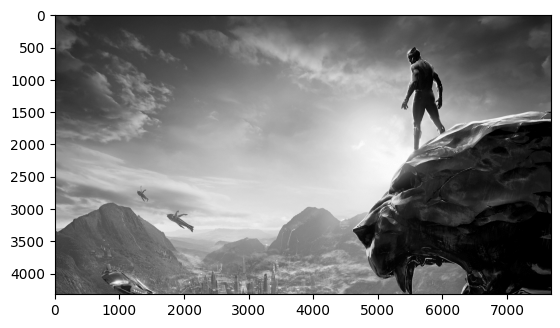

In [67]:
plt.imshow(img.convert("1"))

In [68]:
gray_img=img.convert("1")
gray_img_arr= np.array(gray_img)
print(gray_img_arr.shape)
print(gray_img_arr.ravel().shape)

(4320, 7680)
(33177600,)


# Miscellaneous Image Operations in PIL

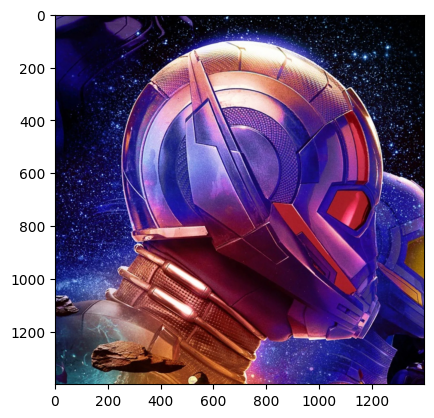

In [70]:
img=Image.open('/content/sample_data/ML_image/quantumania_1.jpg')
plt.imshow(img)

# Get Pixel Value

In [71]:
# (x, y) position
xy=(50,100)
# Get pixel value
pixel_value=img.getpixel(xy)
print(pixel_value)

(13, 4, 59)


# Set Pixel Value

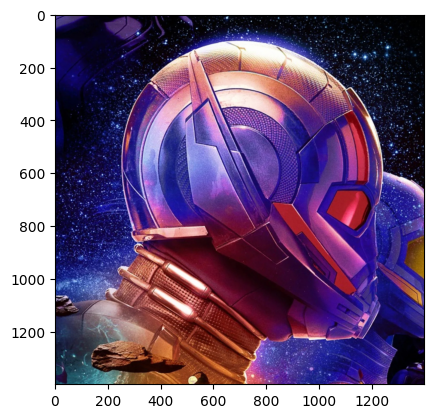

In [73]:
# (x, y) position
xy=(50,100)

# pixel value
value=(255,255,255)

# put pixel value
img.putpixel(xy,value)

plt.imshow(img)

# Blending Images Together

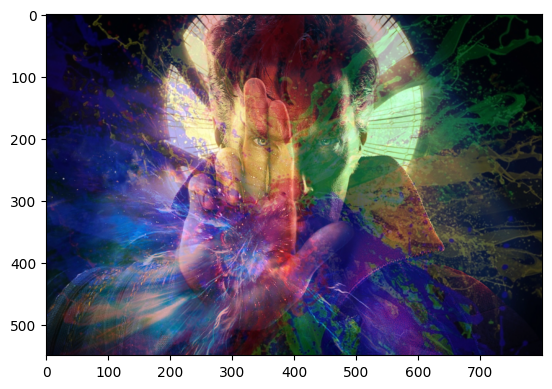

In [76]:
from PIL import Image

# Open the images to be blended
img_1=Image.open('/content/sample_data/ML_image/ds.jpg')
img_2=Image.open('/content/sample_data/ML_image/test_image.jpg')

# Resize the images to the same size
img_1=img_1.resize((800,550))
img_2=img_2.resize((800,550))

# Convert images to same mode
img_1=img_1.convert('RGB')
img_2=img_2.convert('RGB')


# Define the weight of each image
alpha=0.3

# Blend the images together
blend_img=Image.blend(img_1,img_2,alpha)

# Display
plt.imshow(blend_img)


# Overlay Images

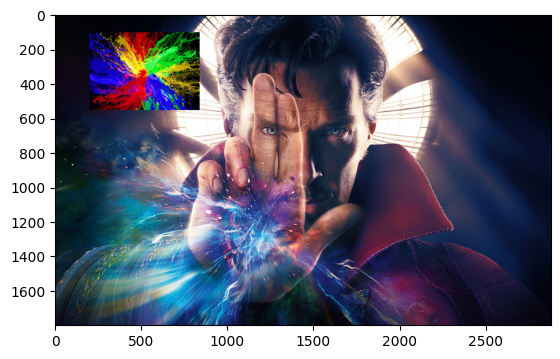

In [77]:
from PIL import Image
# Open the base and overlay images
bse_img=Image.open("/content/sample_data/ML_image/ds.jpg")
overlay_img=Image.open('/content/sample_data/ML_image/test_image.jpg')

# Convert the overlay image to RGBA mode
overlay_img= overlay_img.convert("RGBA")

# Define the position where the overlay image will be pasted
position=(200,100)
# Overlay the image over base image
# Parameter: im, box=None, mask=None
bse_img.paste(overlay_img,position)

# Display
plt.imshow(bse_img)


# Circular Cropping
Below you can find the Python code that crops a portrait in circular shape in 5 steps.

    We will open the image to be cropped (img)
    We will create a transparent background (background)
    We will create a transparent mask layer (mask)
    We will draw a circle on the mask layer (mask)
    We will paste the img on background based on the mask.

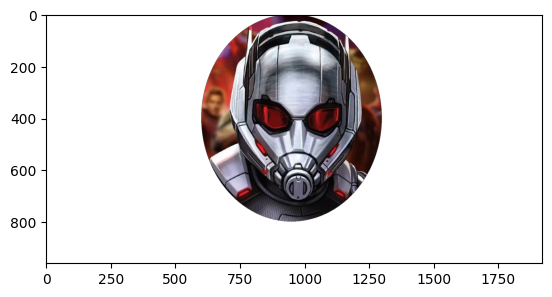

In [78]:
from PIL import Image,ImageFont,ImageDraw

# Read the Image
img=Image.open('/content/sample_data/ML_image/quantumania_2.png').convert("RGBA")

# Create the transparent(i.e. alpha=0) background.
background=Image.new(mode='RGBA',size=img.size,color=(0,0,0,0))

# Create the transparent(i.e. alpha=0) mask.
mask= Image.new(mode='RGBA',size=img.size,color=(0,0,0,0))

# Create a circle on the mask layer - ImageDraw.ellipse((x0, y0, x1, y1))
draw=ImageDraw.Draw(mask)
draw.ellipse((600,0,1300,800),fill="green",outline=0)

# Paste the 'img' on the 'background' based on the 'mask'
new_img=Image.composite(img,background,mask)

new_img.save('/content/sample_data/ML_image/quantumania_cropped.png')

plt.imshow(new_img)

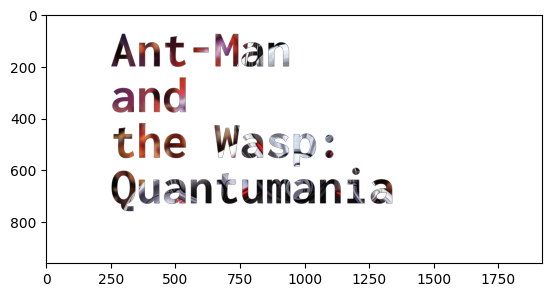

In [79]:
from PIL import ImageFont,ImageFilter,ImageDraw,Image

# Read the Image
img=Image.open('/content/sample_data/ML_image/quantumania_2.png')

# Create the transparent(i.e. alpha=0) background.
background=Image.new(mode='RGBA',size=img.size,color=(0,0,0,0))

# Create the transparent(i.e. alpha=0) mask.
mask=Image.new(mode="RGBA",size=img.size,color=(0,0,0,0))

# Create a circle on the mask layer - ImageDraw.ellipse((x0, y0, x1, y1))
draw=ImageDraw.Draw(mask)

text = "Ant-Man \nand \nthe Wasp: \nQuantumania"

font=ImageFont.truetype('/content/sample_data/ML_image/Inconsolata-Bold.ttf',200)

draw.text((250,30),text,fill='blue',font=font)

new_img=Image.composite(img,background,mask)

new_img.save('/content/sample_data/ML_image/quantumania_text.png')

plt.imshow(new_img)





# Resources
Color Modes - https://holypython.com/python-pil-tutorial/color-modes-explained-for-digital-image-processing-in-python-pil/
Pasting/Composite/Blend Images - https://holypython.com/python-pil-tutorial/pasting-merging-blending-images-with-python-pil

#Creating GIFs

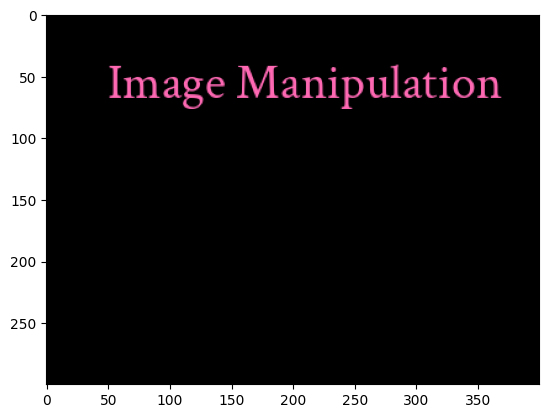

In [87]:
from PIL import Image, ImageFont,ImageDraw

img_1=Image.new(mode='RGB',size=(400,300),color=(0,0,0))

draw_1= ImageDraw.Draw(img_1)

text_1= 'Image Manipulation'

font_1=ImageFont.truetype('/content/sample_data/ML_image/CrimsonText-Regular (1).ttf',40)

draw_1.text((50,30),text_1,font=font_1,fill='hotpink')

plt.imshow(img_1)



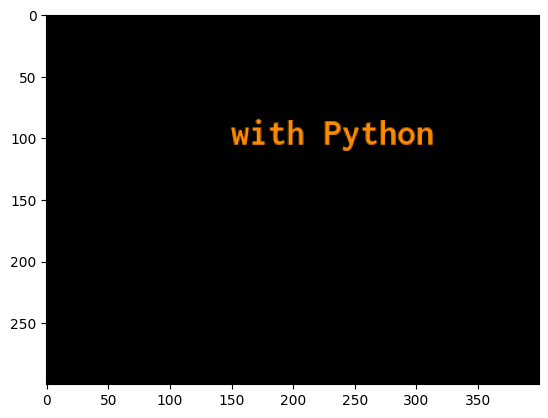

In [90]:
from PIL import ImageFont,Image,ImageDraw

img_2=Image.new(mode="RGB",size=(400,300),color=(0,0,0))

drw_2=ImageDraw.Draw(img_2)

text_2= 'with Python'

font_2=ImageFont.truetype('/content/sample_data/ML_image/Inconsolata-Bold.ttf',30)

drw_2.text((150,80),text_2,font=font_2,fill=(255, 140, 0))

plt.imshow(img_2)

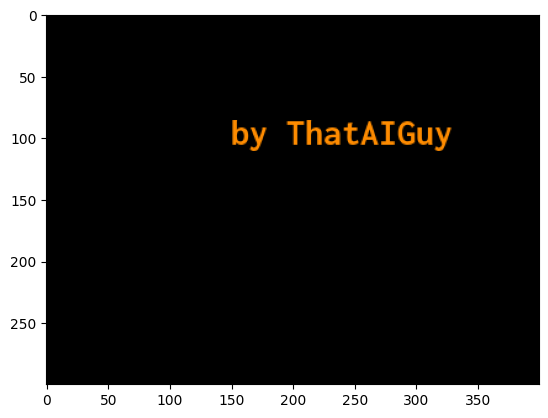

In [91]:
from PIL import ImageFont,Image,ImageDraw

img_3=Image.new(mode="RGB",size=(400,300),color=(0,0,0))

drw_3=ImageDraw.Draw(img_3)

text_3= 'by ThatAIGuy'

font_3=ImageFont.truetype('/content/sample_data/ML_image/Inconsolata-Bold.ttf',30)

drw_3.text((150,80),text_3,font=font_3,fill=(255, 140, 0))

plt.imshow(img_3)